In [4]:
from devgpt_processing.load.model import Issue, Conversation
# sqlalchemy
from sqlalchemy import create_engine
from sqlalchemy.orm import sessionmaker
from sqlalchemy.ext.declarative import declarative_base
# pandas
import pandas as pd
# session
engine = create_engine('sqlite:///devgpt.sqlite')
Session = sessionmaker(bind=engine)
session = Session()

# Get all title and body text from the issues table
issues = session.query(Issue).all()
issues_data = {'id': [issue.id for issue in issues], 'title': [issue.title for issue in issues], 'body': [issue.body for issue in issues], 'language': [issue.language for issue in issues]}
issues_df = pd.DataFrame(issues_data)

# Get all conversations
conversations = session.query(Conversation).all()
conversations_data = {'Prompt': [conversation.Prompt for conversation in conversations], 'Answer': [conversation.Answer for conversation in conversations], 'id': [conversation.id for conversation in conversations], 'language': [conversation.language for conversation in conversations]}
conversations_df = pd.DataFrame(conversations_data)

In [11]:
# issues with refactor in title or body
issues_df['refactor'] = issues_df['title'].str.contains('refactor', case=False) | issues_df['body'].str.contains('refactor', case=False)
# issues with bug in title or body
issues_df['bug'] = issues_df['title'].str.contains('bug', case=False) | issues_df['body'].str.contains('bug', case=False)
# issues with code quality in title or body
issues_df['code_quality'] = issues_df['title'].str.contains('code quality', case=False) | issues_df['body'].str.contains('code quality', case=False)

# conversations with refactor in prompt or answer
conversations_df['refactor'] = conversations_df['Prompt'].str.contains('refactor', case=False) | conversations_df['Answer'].str.contains('refactor', case=False)
# conversations with bug in prompt or answer
conversations_df['bug'] = conversations_df['Prompt'].str.contains('bug', case=False) | conversations_df['Answer'].str.contains('bug', case=False)
# conversations with code quality in prompt or answer
conversations_df['code_quality'] = conversations_df['Prompt'].str.contains('code quality', case=False) | conversations_df['Answer'].str.contains('code quality', case=False)


In [12]:
print( f" Issue \n refactor {issues_df.value_counts('refactor')} \n bug {issues_df.value_counts('bug')/4} \n code_quality {issues_df.value_counts('code_quality')/4}")
print( f" Conversations \n refactor {conversations_df.value_counts('refactor')} \n bug {conversations_df.value_counts('bug')} \n code_quality {conversations_df.value_counts('code_quality')}")


 Issue 
 refactor refactor
False    753.75
True      16.00
Name: count, dtype: float64 
 bug bug
False    706.75
True      63.00
Name: count, dtype: float64 
 code_quality code_quality
False    768.00
True       1.75
Name: count, dtype: float64
 Conversations 
 refactor refactor
False    14185
True       114
Name: count, dtype: int64 
 bug bug
False    13697
True       602
Name: count, dtype: int64 
 code_quality code_quality
False    14297
True         2
Name: count, dtype: int64


In [3]:
conversations_df

,Prompt,Answer,id,language
0,あなたはwebデザイナーです。ハンバーガーメニューを実装したところ、初めからメニューの内容が...,ハンバーガーメニューが初めから表示されており、表示非表示を切り替えることができない理由は、c...,1,"('ja',)"
1,「ハンバーガーメニュー」とはなんですか。,ハンバーガーメニュー（Hamburger menu）は、ウェブデザインやユーザーインターフェ...,2,"('en',)"
2,そうですね。ありがとうございます。\n\n今回は初めから「ハンバーガーメニュー」が表示されて...,申し訳ありません、誤解が生じました。ハンバーガーメニューの問題点について理解しました。メニュ...,3,"('en',)"
3,変更点を解説してください。,修正点を以下で解説します。.containerクラスにdisplay: none;のスタイル...,4,"('en',)"
4,変更を加えましたが、メニューが最初から表示されていて、ハンバーガーアイコンをクリックしても切...,申し訳ありません、再度問題を確認いたしました。修正が不足していたため、以下の修正を加えてくだ...,5,"('en',)"
...,...,...,...,...
14294,continue,ChatGPTUsed WebPilotThe version of the FSRS tu...,14295,"('en',)"
14295,proceed,ChatGPTUsed WebPilotThe version of the FSRS tu...,14296,"('fr',)"
14296,I wish that in typescript I could mark a funct...,ChatGPTAs of my knowledge cutoff in September ...,14297,"('en',)"
14297,Are there no other options that use static ana...,ChatGPTAs of my knowledge cut-off in September...,14298,"('en',)"


In [2]:
# random english prompt with answer
conversations_df[conversations_df['language'] == 'en'].sample(1)


ValueError: a must be greater than 0 unless no samples are taken

In [6]:
eng_issues_df = issues_df[issues_df['language'] == 'en']
eng_conversations_df = conversations_df[conversations_df['language'] == 'en']
eng_conversations_df.head()

,Prompt,Answer,id,language


In [73]:
import yake
def extract_keywords(text):
    kw_extractor = yake.KeywordExtractor()
    keywords = kw_extractor.extract_keywords(text)
    return [keyword for keyword, score in keywords]

def replace_chat_links(text):
    # Define a regular expression pattern to match the URL
    pattern = r'https://chat.openai.com/share/[\w-]+'
    
    # Replace the matched URL with 'CHATGPT_LINK'
    replaced_text = re.sub(pattern, 'CHATGPT_LINK', text)
    
    return replaced_text


In [45]:

import gensim
from gensim.utils import simple_preprocess



# Lowercase the 'title' and 'body' columns in eng_issues_df
eng_issues_df.loc[:, 'title'] = eng_issues_df['title'].str.lower()
eng_issues_df.loc[:, 'body'] = eng_issues_df['body'].str.lower()
# Replace chat links with 'CHATGPT_LINK'
eng_issues_df.loc[:, 'title'] = eng_issues_df['title'].apply(replace_chat_links)
eng_issues_df.loc[:, 'body'] = eng_issues_df['body'].apply(replace_chat_links)



# Lowercase the 'Prompt' and 'Answer' columns in eng_conversations_df
eng_conversations_df.loc[:, 'Prompt'] = eng_conversations_df['Prompt'].str.lower()
eng_conversations_df.loc[:, 'Answer'] = eng_conversations_df['Answer'].str.lower()
# Replace chat links with 'CHATGPT_LINK'
eng_conversations_df.loc[:, 'Prompt'] = eng_conversations_df['Prompt'].apply(replace_chat_links)
eng_conversations_df.loc[:, 'Answer'] = eng_conversations_df['Answer'].apply(replace_chat_links)

# Preprocessing for LDA


In [75]:
import gensim
from gensim.utils import simple_preprocess
ssl._create_default_https_context = ssl._create_unverified_context
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import ssl

stop_words = stopwords.words('english')

def sen_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

data = eng_conversations_df['Prompt'].values.tolist() 
data_words = list(sen_to_words(data))

# Remove Stop Words
data_words = remove_stopwords(data_words)
print(data_words)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anushkrishnav/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[['ハンハーカーメニュー', 'とはなんてすか'], ['そうてすね', 'ありかとうこさいます', '今回は初めから', 'ハンハーカーメニュー', 'か表示されていることは適切てす', 'しかし', 'あらためて', '解決策を提示していたたけますか'], ['変更点を解説してくたさい'], ['変更を加えましたか'], ['本当てすか'], ['ハス指定に問題はありません'], ['変更点の解説をしてくたさい'], ['なるほと', '試してみたところ', 'しかし', '修正してくたさい'], ['やはり依然として最初にメニュ', 'の内容か表示されてしまいます'], ['たたし', '使用可能な言語は', 'html', 'css', 'javascript', 'てす'], ['ありかとうこさいます'], ['承知しました', 'ちなみに', 'とは'], ['本当てすか'], [], ['助かります', 'ありかとうこさいます'], [], ['ありかとうこさいます', 'nav'], ['ありかとうこさいます'], ['ては'], ['試しましたか', 'やはり最初から表示されています'], ['直りません'], ['解決しません'], ['add', 'java', 'class', 'generic', 'container', 'testcontainers', 'order', 'run', 'later'], ['show', 'code'], ['say', 'add', 'physical', 'java', 'class', 'inside', 'generic', 'container'], ['run', 'java', 'class', 'inside', 'container', 'testcontainers'], ['need', 'add', 'java', 'class', 'dynamically', 'execute', 'receive', 'results'], ['explain', 'code', 'import', 'collections', 'import', 'math', 'import', 'os', 'import', 'pickle', 'import', 'typing', 'impor

In [76]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus)

[[(0, 1), (1, 1)], [(1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)], [(9, 1)], [(10, 1)], [(11, 1)], [(12, 1)], [(13, 1)], [(5, 1), (14, 1), (15, 1), (16, 1)], [(17, 1), (18, 1)], [(19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1)], [(3, 1)], [(25, 1), (26, 1), (27, 1)], [(11, 1)], [], [(3, 1), (28, 1)], [], [(3, 1), (29, 1)], [(3, 1)], [(30, 1)], [(31, 1), (32, 1)], [(33, 1)], [(34, 1)], [(35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1)], [(44, 1), (45, 1)], [(35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (46, 1), (47, 1), (48, 1)], [(36, 1), (37, 1), (39, 1), (42, 1), (43, 1), (46, 1)], [(35, 1), (36, 1), (39, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1)], [(36, 1), (44, 1), (54, 1), (55, 1), (56, 1), (57, 2), (58, 3), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 2), (65, 2), (66, 2), (67, 1), (68, 1), (69, 2), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 7), (78, 2), (79, 4), (80, 1), (81, 3), (82, 1), (8

In [77]:
from pprint import pprint
# number of topics
num_topics = 10
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.010*"model" + 0.008*"self" + 0.007*"return" + 0.006*"file" + 0.006*"use" '
  '+ 0.005*"import" + 0.005*"public" + 0.005*"using" + 0.005*"py" + '
  '0.005*"models"'),
 (1,
  '0.009*"return" + 0.008*"calcom" + 0.008*"py" + 0.007*"python" + '
  '0.007*"self" + 0.007*"get" + 0.006*"packages" + 0.006*"line" + 0.006*"text" '
  '+ 0.005*"lib"'),
 (2,
  '0.010*"none" + 0.010*"self" + 0.008*"https" + 0.006*"div" + 0.006*"product" '
  '+ 0.006*"config" + 0.006*"name" + 0.005*"json" + 0.005*"model" + '
  '0.005*"github"'),
 (3,
  '0.013*"calcom" + 0.013*"self" + 0.012*"none" + 0.008*"model" + '
  '0.007*"python" + 0.006*"name" + 0.006*"config" + 0.005*"return" + '
  '0.005*"else" + 0.005*"li"'),
 (4,
  '0.017*"lib" + 0.011*"file" + 0.009*"line" + 0.009*"py" + 0.008*"https" + '
  '0.008*"python" + 0.008*"name" + 0.007*"com" + 0.007*"usr" + 0.007*"site"'),
 (5,
  '0.013*"python" + 0.010*"https" + 0.010*"py" + 0.009*"file" + 0.009*"local" '
  '+ 0.009*"lib" + 0.008*"usr" + 0.008*"line" + 0

In [78]:
import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))
# create the file path
import os 
os.makedirs(os.path.dirname(LDAvis_data_filepath), exist_ok=True)

if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.078368  0.029897       1        1  14.389042
8      0.075068  0.035464       2        1  12.758582
4      0.074361 -0.022297       3        1  11.283190
0      0.013514 -0.060494       4        1  11.214712
9     -0.037405 -0.076663       5        1   9.767916
5      0.063885  0.025403       6        1   9.360699
1     -0.011253  0.000737       7        1   8.771673
2     -0.043086  0.039644       8        1   8.645353
6     -0.021524  0.027694       9        1   7.504669
3     -0.035194  0.000615      10        1   6.304164, topic_info=        Term         Freq        Total Category  logprob  loglift
5482  calcom  1513.000000  1513.000000  Default  30.0000  30.0000
150     none  4395.000000  4395.000000  Default  29.0000  29.0000
638      lib  4546.000000  4546.000000  Default  28.0000  28.0000
646       py  5247.000000  5247.000000  Default  27.0000  27.0000
186     self  6028.000000  6028.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
316     json   145.403536  2082.630482  Topic10  -5.7537   0.1021
44      code   144.911883  2407.931106  Topic10  -5.7571  -0.0464
77       def   138.659563  2115.617633  Topic10  -5.8012   0.0389
646       py   131.427311  5247.720191  Topic10  -5.8548  -0.9231
498    using   127.068868  2600.730870  Topic10  -5.8885  -0.2549

[893 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
8578      1  0.917918   absoutely
8253      8  0.928372  absoutlely
7020      1  0.079353         acf
7020      2  0.374722         acf
7020      3  0.011756         acf
...     ...       ...         ...
6630      8  0.821591       邀我至田家
6631      8  0.928907         长相思
6632      7  0.136947       青山郭外斜
6632      8  0.821682       青山郭外斜
9671      5  0.904439          首先

[3209 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 9, 5, 1, 10, 6, 2, 3, 7, 4])

In [ ]:
# obtains topics talking about refactoring



In [ ]:

# remove stopwords
from nltk.corpus import stopwords
stop = stopwords.words('english')

eng_issues_df['title'] = eng_issues_df['title'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
eng_issues_df['body'] = eng_issues_df['body'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
eng_conversations_df['Prompt'] = eng_conversations_df['Prompt'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
eng_conversations_df['Answer'] = eng_conversations_df['Answer'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))


eng_issues_df['title_keywords'] = eng_issues_df['title'].apply(extract_keywords)
eng_issues_df['body_keywords'] = eng_issues_df['body'].apply(extract_keywords)



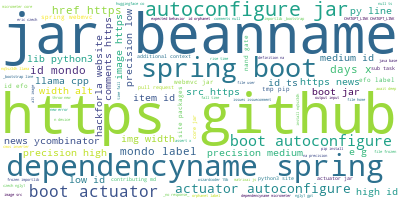

In [47]:
from wordcloud import WordCloud


def create_word_clout(df, col_name):
    # a super string of all the titles
    titles = df[col_name].str.cat(sep=' ')

    wordcloud = WordCloud(background_color="white", contour_width=3, contour_color='steelblue')

    wordcloud.generate(titles)

    return wordcloud.to_image()

# combine 2 images
create_word_clout(eng_issues_df, 'title')
create_word_clout(eng_issues_df, 'body')



In [42]:
import re

def replace_chat_links(text):
    # Define a regular expression pattern to match the URL
    pattern = r'https://chat.openai.com/share/[\w-]+'
    
    # Replace the matched URL with 'CHATGPT_LINK'
    replaced_text = re.sub(pattern, 'CHATGPT_LINK', text)
    
    return replaced_text

# Example usage:
original_text = "Check out this link: https://chat.openai.com/share/b508djhdgdddd3-af83-4206-89fe-bb55b88ec212"
modified_text = replace_chat_links(original_text)
print(modified_text)  # Output: "Check out this link: CHATGPT_LINK"


Check out this link: CHATGPT_LINK
